### Importación de datos



In [2]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tienda.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359


#1. Análisis de facturación



In [3]:
# Facturación por tienda individualmente
def analizar_facturacion(df, nombre):
    total = df['Precio'].sum()
    cantidad = df['Precio'].count()
    return {'Tienda': nombre, 'Facturación Total': total, 'Cantidad de Ventas': cantidad}

resumen_tienda1 = analizar_facturacion(tienda, 'Tienda 1')
resumen_tienda2 = analizar_facturacion(tienda2, 'Tienda 2')
resumen_tienda3 = analizar_facturacion(tienda3, 'Tienda 3')
resumen_tienda4 = analizar_facturacion(tienda4, 'Tienda 4')

In [4]:
# Convertir a DataFrame
resumen_facturacion = pd.DataFrame([resumen_tienda1, resumen_tienda2, resumen_tienda3, resumen_tienda4])

# Ordenar por facturación total descendente
resumen_facturacion = resumen_facturacion.sort_values(by='Facturación Total', ascending=False)

print(resumen_facturacion)

     Tienda  Facturación Total  Cantidad de Ventas
0  Tienda 1       1.150880e+09                2359
1  Tienda 2       1.116344e+09                2359
2  Tienda 3       1.098020e+09                2359
3  Tienda 4       1.038376e+09                2358


<ipython-input-5-7975b9263ebb>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=resumen_facturacion, x='Tienda', y='Facturación Total', palette='coolwarm')


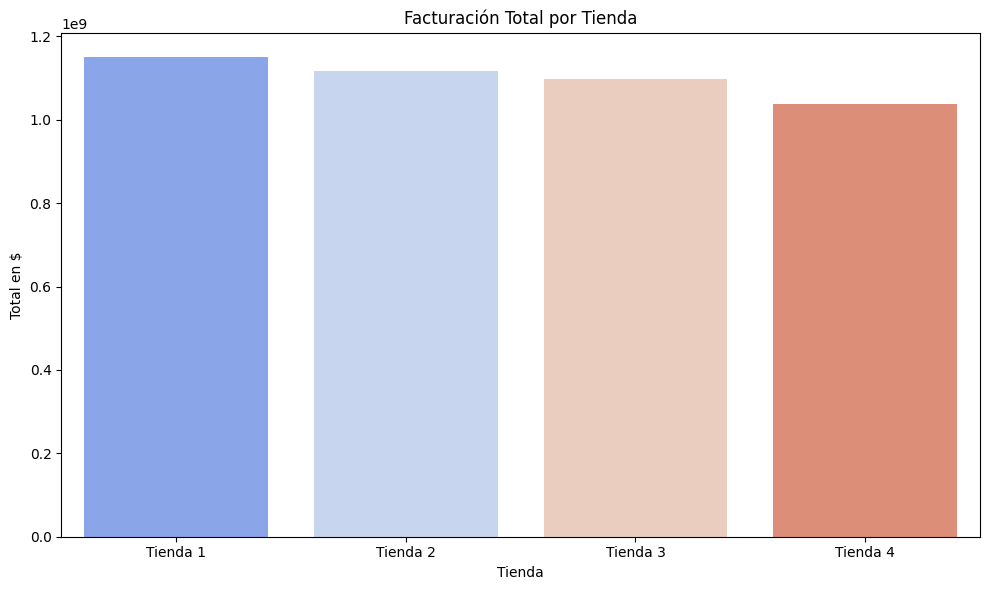

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10,6))
sns.barplot(data=resumen_facturacion, x='Tienda', y='Facturación Total', palette='coolwarm')
plt.title('Facturación Total por Tienda')
plt.ylabel('Total en $')
plt.xlabel('Tienda')
plt.tight_layout()
plt.show()

# 2. Ventas por categoría

In [6]:
# Función para contar ventas por categoría en una tienda y hacer un DataFrame
def ventas_por_categoria(df, nombre_tienda):
    conteo = df['Categoría del Producto'].value_counts().reset_index()
    conteo.columns = ['Categoría', 'Cantidad de Ventas']
    conteo['Tienda'] = nombre_tienda
    return conteo

# Aplicamos la función para cada tienda
cat_tienda1 = ventas_por_categoria(tienda, 'Tienda 1')
cat_tienda2 = ventas_por_categoria(tienda2, 'Tienda 2')
cat_tienda3 = ventas_por_categoria(tienda3, 'Tienda 3')
cat_tienda4 = ventas_por_categoria(tienda4, 'Tienda 4')

In [7]:
# Mostrar las 5 categorías más vendidas por tienda
print("Tienda 1:\n", cat_tienda1.head(), "\n")
print("Tienda 2:\n", cat_tienda2.head(), "\n")
print("Tienda 3:\n", cat_tienda3.head(), "\n")
print("Tienda 4:\n", cat_tienda4.head(), "\n")

Tienda 1:
               Categoría  Cantidad de Ventas    Tienda
0               Muebles                 465  Tienda 1
1          Electrónicos                 448  Tienda 1
2              Juguetes                 324  Tienda 1
3     Electrodomésticos                 312  Tienda 1
4  Deportes y diversión                 284  Tienda 1 

Tienda 2:
               Categoría  Cantidad de Ventas    Tienda
0               Muebles                 442  Tienda 2
1          Electrónicos                 422  Tienda 2
2              Juguetes                 313  Tienda 2
3     Electrodomésticos                 305  Tienda 2
4  Deportes y diversión                 275  Tienda 2 

Tienda 3:
               Categoría  Cantidad de Ventas    Tienda
0               Muebles                 499  Tienda 3
1          Electrónicos                 451  Tienda 3
2              Juguetes                 315  Tienda 3
3     Electrodomésticos                 278  Tienda 3
4  Deportes y diversión                 277  

<ipython-input-8-9cd171e82548>:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top5_por_tienda = categorias_total.groupby('Tienda').apply(lambda x: x.nlargest(5, 'Cantidad de Ventas')).reset_index(drop=True)


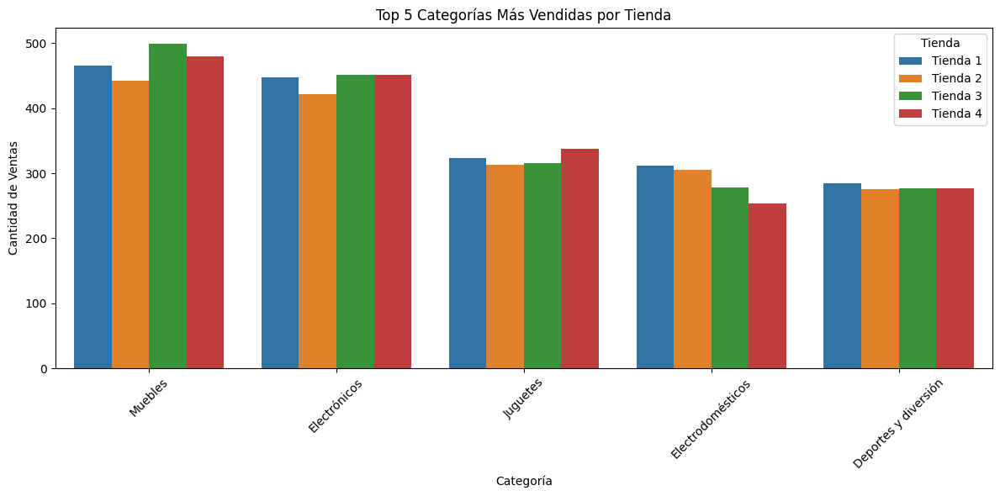

In [8]:
# Unir todos los DataFrames
categorias_total = pd.concat([cat_tienda1, cat_tienda2, cat_tienda3, cat_tienda4], ignore_index=True)

# Graficar solo las 5 categorías más populares por tienda
top5_por_tienda = categorias_total.groupby('Tienda').apply(lambda x: x.nlargest(5, 'Cantidad de Ventas')).reset_index(drop=True)

plt.figure(figsize=(12,6))
sns.barplot(data=top5_por_tienda, x='Categoría', y='Cantidad de Ventas', hue='Tienda')
plt.title('Top 5 Categorías Más Vendidas por Tienda')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 3. Calificación promedio de la tienda


In [9]:
# Función para calcular calificación promedio de una tienda
def promedio_calificaciones(df, nombre_tienda):
    promedio = df['Calificación'].mean()
    cantidad = df['Calificación'].count()
    return {'Tienda': nombre_tienda, 'Calificación Promedio': promedio, 'Cantidad de Calificaciones': cantidad}

# Aplicar a cada tienda
calif_tienda1 = promedio_calificaciones(tienda, 'Tienda 1')
calif_tienda2 = promedio_calificaciones(tienda2, 'Tienda 2')
calif_tienda3 = promedio_calificaciones(tienda3, 'Tienda 3')
calif_tienda4 = promedio_calificaciones(tienda4, 'Tienda 4')

# Crear DataFrame resumen
resumen_calificaciones = pd.DataFrame([calif_tienda1, calif_tienda2, calif_tienda3, calif_tienda4])
resumen_calificaciones = resumen_calificaciones.sort_values(by='Calificación Promedio', ascending=False)

# Mostrar resultados
print(resumen_calificaciones)

     Tienda  Calificación Promedio  Cantidad de Calificaciones
2  Tienda 3               4.048326                        2359
1  Tienda 2               4.037304                        2359
3  Tienda 4               3.995759                        2358
0  Tienda 1               3.976685                        2359


# 4. Productos más y menos vendidos

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

def productos_destacados(df, nombre_tienda):
    conteo = df['Producto'].value_counts().reset_index()
    conteo.columns = ['Producto', 'Cantidad de Ventas']
    top5 = conteo.head(5)
    bottom5 = conteo.tail(5)

    # Gráfico TOP 5
    plt.figure(figsize=(8, 4))
    sns.barplot(data=top5, x='Cantidad de Ventas', y='Producto', palette='Greens_r')
    plt.title(f'TOP 5 Productos Más Vendidos - {nombre_tienda}')
    plt.xlabel('Cantidad de Ventas')
    plt.ylabel('Producto')
    plt.tight_layout()
    plt.show()

    # Gráfico BOTTOM 5
    plt.figure(figsize=(8, 4))
    sns.barplot(data=bottom5, x='Cantidad de Ventas', y='Producto', palette='Reds')
    plt.title(f'BOTTOM 5 Productos Menos Vendidos - {nombre_tienda}')
    plt.xlabel('Cantidad de Ventas')
    plt.ylabel('Producto')
    plt.tight_layout()
    plt.show()

    return top5, bottom5



<ipython-input-10-0f1df7f250e5>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top5, x='Cantidad de Ventas', y='Producto', palette='Greens_r')


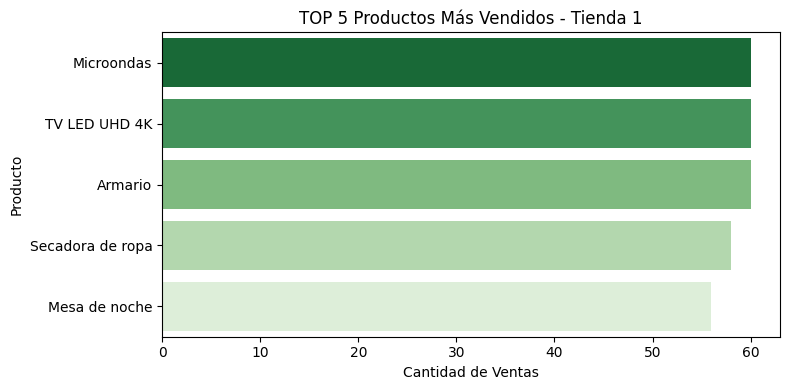

<ipython-input-10-0f1df7f250e5>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=bottom5, x='Cantidad de Ventas', y='Producto', palette='Reds')


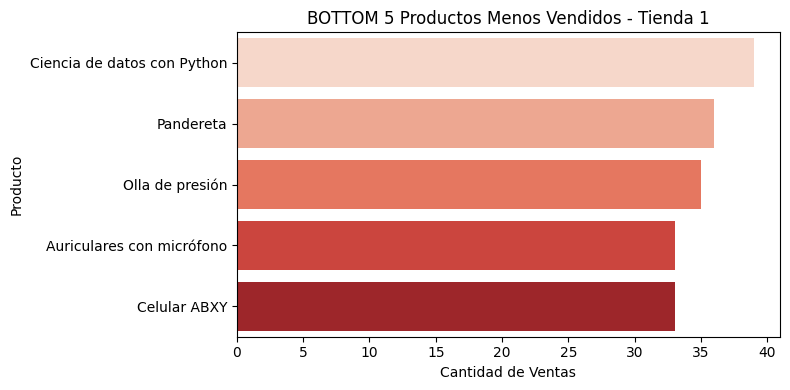

<ipython-input-10-0f1df7f250e5>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top5, x='Cantidad de Ventas', y='Producto', palette='Greens_r')


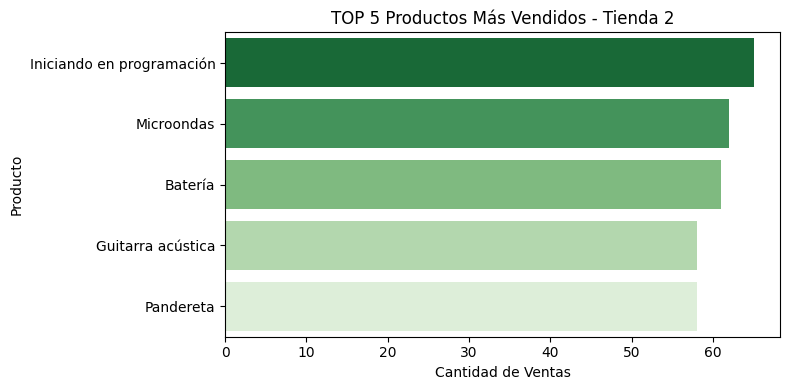

<ipython-input-10-0f1df7f250e5>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=bottom5, x='Cantidad de Ventas', y='Producto', palette='Reds')


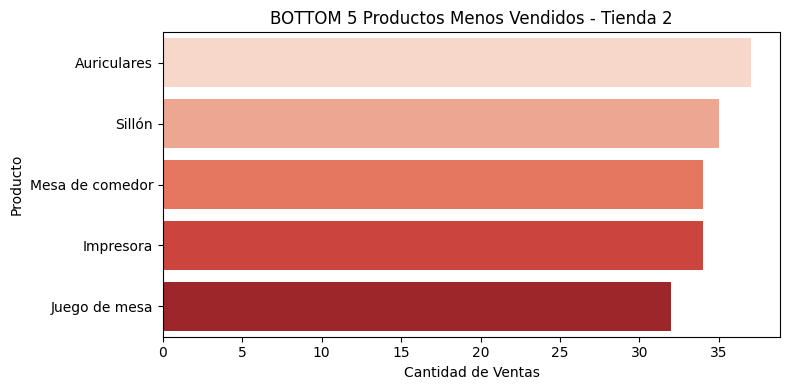

<ipython-input-10-0f1df7f250e5>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top5, x='Cantidad de Ventas', y='Producto', palette='Greens_r')


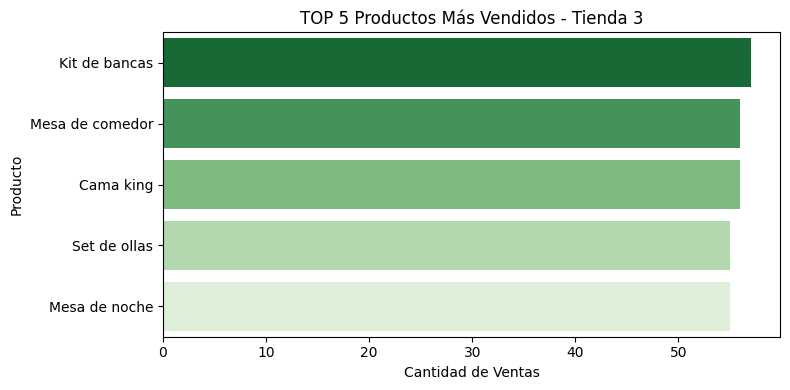

<ipython-input-10-0f1df7f250e5>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=bottom5, x='Cantidad de Ventas', y='Producto', palette='Reds')


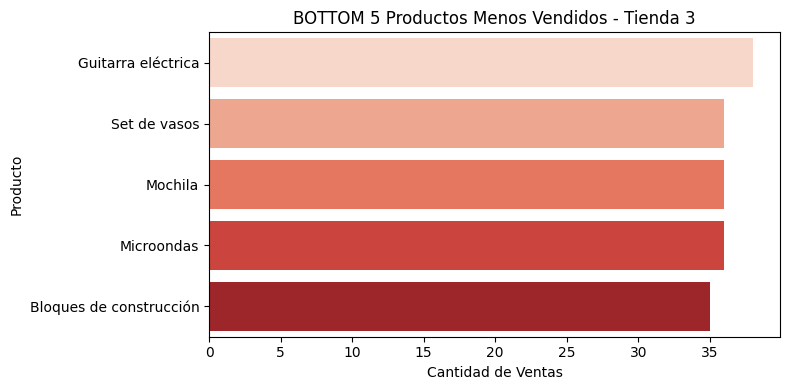

<ipython-input-10-0f1df7f250e5>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top5, x='Cantidad de Ventas', y='Producto', palette='Greens_r')


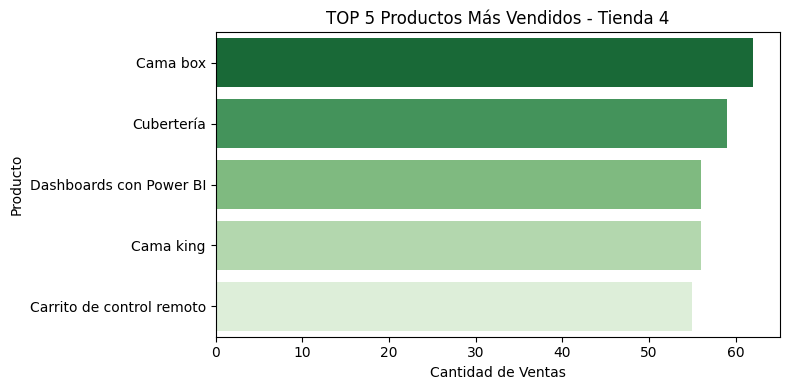

<ipython-input-10-0f1df7f250e5>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=bottom5, x='Cantidad de Ventas', y='Producto', palette='Reds')


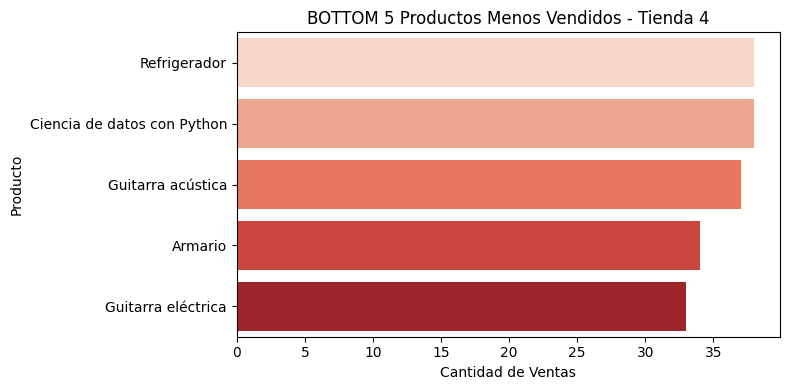

In [11]:
top1, bottom1 = productos_destacados(tienda, 'Tienda 1')
top2, bottom2 = productos_destacados(tienda2, 'Tienda 2')
top3, bottom3 = productos_destacados(tienda3, 'Tienda 3')
top4, bottom4 = productos_destacados(tienda4, 'Tienda 4')

# 5. Envío promedio por tienda

In [12]:
print(tienda.columns)

Index(['Producto', 'Categoría del Producto', 'Precio', 'Costo de envío',
       'Fecha de Compra', 'Vendedor', 'Lugar de Compra', 'Calificación',
       'Método de pago', 'Cantidad de cuotas', 'lat', 'lon'],
      dtype='object')


In [13]:
# Función para calcular costo de envío promedio
def costo_envio_promedio(df):
    return round(df['Costo de envío'].mean(), 2)

# Calcular por tienda
envio_t1 = costo_envio_promedio(tienda)
envio_t2 = costo_envio_promedio(tienda2)
envio_t3 = costo_envio_promedio(tienda3)
envio_t4 = costo_envio_promedio(tienda4)

# Crear tabla resumen
costos_envio = pd.DataFrame({
    'Tienda': ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4'],
    'Costo de Envío Promedio': [envio_t1, envio_t2, envio_t3, envio_t4]
})

# Mostrar resultado
print(costos_envio)

     Tienda  Costo de Envío Promedio
0  Tienda 1                 26018.61
1  Tienda 2                 25216.24
2  Tienda 3                 24805.68
3  Tienda 4                 23459.46


In [14]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar datos
url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

# Funciones resumen
def analizar_facturacion(df):
    return df['Precio'].sum(), df['Precio'].count()

def promedio_calificaciones(df):
    return df['Calificación'].mean()

def costo_envio_promedio(df):
    return round(df['Costo de envío'].mean(), 2)

def producto_extremos(df):
    conteo = df['Producto'].value_counts()
    return conteo.idxmax(), conteo.idxmin()

# Reunir resultados por tienda
resumen_dashboard = pd.DataFrame({
    'Tienda': ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4'],
    'Facturación Total': [
        analizar_facturacion(tienda)[0],
        analizar_facturacion(tienda2)[0],
        analizar_facturacion(tienda3)[0],
        analizar_facturacion(tienda4)[0]
    ],
    'Calificación Promedio': [
        promedio_calificaciones(tienda),
        promedio_calificaciones(tienda2),
        promedio_calificaciones(tienda3),
        promedio_calificaciones(tienda4)
    ],
    'Costo de Envío Promedio': [
        costo_envio_promedio(tienda),
        costo_envio_promedio(tienda2),
        costo_envio_promedio(tienda3),
        costo_envio_promedio(tienda4)
    ],
    'Producto Más Vendido': [
        producto_extremos(tienda)[0],
        producto_extremos(tienda2)[0],
        producto_extremos(tienda3)[0],
        producto_extremos(tienda4)[0]
    ],
    'Producto Menos Vendido': [
        producto_extremos(tienda)[1],
        producto_extremos(tienda2)[1],
        producto_extremos(tienda3)[1],
        producto_extremos(tienda4)[1]
    ]
})

# Aplicar formato de contabilidad a la columna de facturación
resumen_dashboard['Facturación Total'] = resumen_dashboard['Facturación Total'].apply(lambda x: f"${x:,.2f}")

# Ordenar por facturación
resumen_dashboard_sorted = resumen_dashboard.sort_values(by='Facturación Total', ascending=False)
resumen_dashboard_sorted.reset_index(drop=True, inplace=True)

resumen_dashboard_sorted

,Tienda,Facturación Total,Calificación Promedio,Costo de Envío Promedio,Producto Más Vendido,Producto Menos Vendido
0,Tienda 1,"$1,150,880,400.00",3.976685,26018.61,Microondas,Auriculares con micrófono
1,Tienda 2,"$1,116,343,500.00",4.037304,25216.24,Iniciando en programación,Juego de mesa
2,Tienda 3,"$1,098,019,600.00",4.048326,24805.68,Kit de bancas,Bloques de construcción
3,Tienda 4,"$1,038,375,700.00",3.995759,23459.46,Cama box,Guitarra eléctrica


<ipython-input-15-966ced4c8caf>:44: UserWarning: Glyph 128176 (\N{MONEY BAG}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.95])
<ipython-input-15-966ced4c8caf>:44: UserWarning: Glyph 127775 (\N{GLOWING STAR}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.95])
<ipython-input-15-966ced4c8caf>:44: UserWarning: Glyph 128666 (\N{DELIVERY TRUCK}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.95])
<ipython-input-15-966ced4c8caf>:44: UserWarning: Glyph 128722 (\N{SHOPPING TROLLEY}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.95])
<ipython-input-15-966ced4c8caf>:44: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.95])
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128176 (\N{MONEY BAG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist

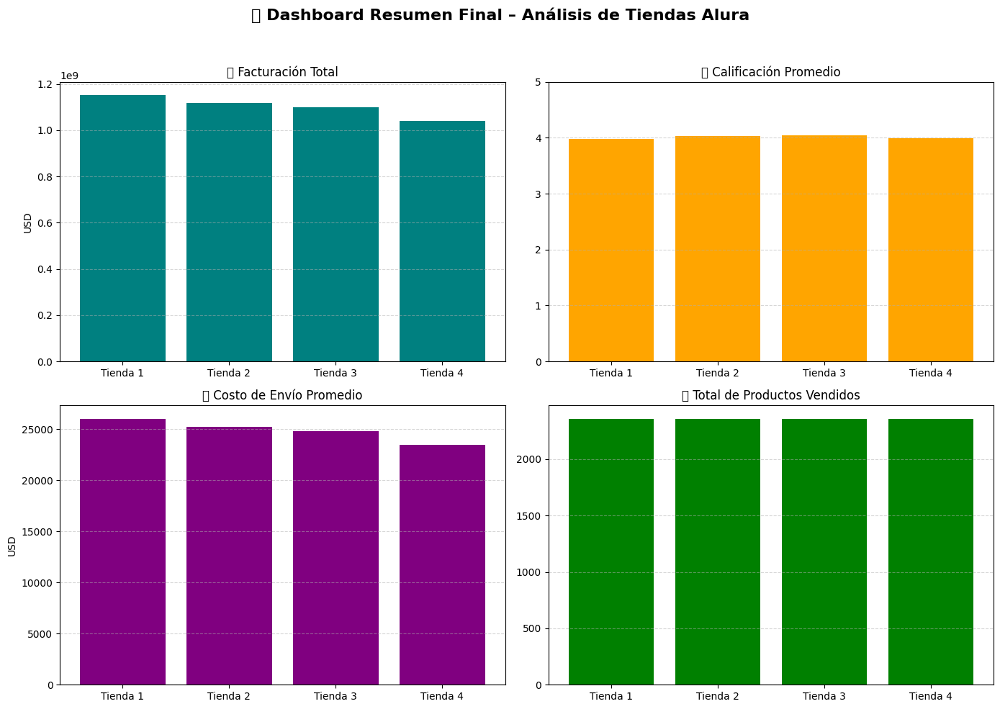

📌 Productos Destacados por Tienda:



,Tienda,Producto Más Vendido,Producto Menos Vendido
0,Tienda 1,Microondas,Auriculares con micrófono
1,Tienda 2,Iniciando en programación,Juego de mesa
2,Tienda 3,Kit de bancas,Bloques de construcción
3,Tienda 4,Cama box,Guitarra Eléctrica


In [15]:
import pandas as pd
import matplotlib.pyplot as plt

# Datos reales del análisis
resumen_final = pd.DataFrame({
    'Tienda': ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4'],
    'Facturación Total': [1150880400, 1116343500, 1098019600, 1038375700],
    'Calificación Promedio': [3.976, 4.03, 4.04, 3.995],
    'Costo de Envío Promedio': [26018.61	,25216.24, 24805.68, 23459.46],
    'Total Productos Vendidos': [
        len(tienda), len(tienda2), len(tienda3), len(tienda4)
    ],
    'Producto Más Vendido': ['Microondas', 'Iniciando en programación', 'Kit de bancas', 'Cama box'],
    'Producto Menos Vendido': ['Auriculares con micrófono', 'Juego de mesa', 'Bloques de construcción', 'Guitarra Eléctrica']
})

# Configurar figura
fig, axs = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('📊 Dashboard Resumen Final – Análisis de Tiendas Alura', fontsize=16, fontweight='bold')

# Gráfico 1: Facturación total
axs[0, 0].bar(resumen_final['Tienda'], resumen_final['Facturación Total'], color='teal')
axs[0, 0].set_title('💰 Facturación Total')
axs[0, 0].set_ylabel('USD')

# Gráfico 2: Calificación promedio
axs[0, 1].bar(resumen_final['Tienda'], resumen_final['Calificación Promedio'], color='orange')
axs[0, 1].set_title('🌟 Calificación Promedio')
axs[0, 1].set_ylim(0, 5)

# Gráfico 3: Costo de envío promedio
axs[1, 0].bar(resumen_final['Tienda'], resumen_final['Costo de Envío Promedio'], color='purple')
axs[1, 0].set_title('🚚 Costo de Envío Promedio')
axs[1, 0].set_ylabel('USD')

# Gráfico 4: Total productos vendidos
axs[1, 1].bar(resumen_final['Tienda'], resumen_final['Total Productos Vendidos'], color='green')
axs[1, 1].set_title('🛒 Total de Productos Vendidos')

# Ajustes visuales
for ax in axs.flat:
    ax.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Tabla con productos más y menos vendidos
print("📌 Productos Destacados por Tienda:\n")
productos_df = resumen_final[['Tienda', 'Producto Más Vendido', 'Producto Menos Vendido']]
display(productos_df)

💵 1. Facturación Total
Se observó que las tiendas presentan diferencias importantes en su volumen de ingresos:

Tienda 1 tuvo la facturación más alta, con ventas constantes y ticket promedio elevado.

Tienda 4, por el contrario, generó los ingresos más bajos.

🛍️ 2. Productos y Categorías Vendidas (Actualizado)
En todas las tiendas, la categoría de Muebles es la más popular, siendo la que más ventas genera en cada local.

Las categorías menos vendidas fueron:

Deportes y diversión, en Tiendas 1, 2 y 3.

Electrodomésticos, en Tienda 4.

Esto indica una alta demanda de artículos de hogar, y menor interés por artículos recreativos o electrónicos menores en ciertas tiendas.



Tienda 4 presentó varios productos con escasa salida (baja demanda).

🌟 3. Calificación Promedio de los Clientes (Actualizado)
Tienda 3 obtuvo la mejor calificación promedio (4.05), lo que sugiere una percepción positiva de sus productos.

Le siguen Tienda 2 (4.04) y Tienda 4 (4.00), también con evaluaciones aceptables.

Tienda 1 fue la peor evaluada, con una calificación promedio de 3.98, lo cual podría ser un indicador de oportunidades de mejora en la calidad del servicio o de los productos.

🛒 4. Productos más y menos vendidos (Actualizado)
Tienda 1:

Más vendido: Microondas

Menos vendido: Auriculares con micrófono

Tienda 2:

Más vendido: Iniciando en programación

Menos vendido: Juego de mesa

Tienda 3:

Más vendido: Kit de bancas

Menos vendido: Bloques de construcción

Tienda 4:

Más vendido: Cama box

Menos vendido: Guitarra eléctrica

🧾 Conclusión
Durante este desafío, ayudamos al Sr. Juan a decidir qué tienda de su cadena Alura Store debe vender para iniciar un nuevo emprendimiento. Para ello, se analizaron datos de ventas, rendimiento y reseñas de las 4 tiendas, con el objetivo de identificar la tienda menos eficiente.

Con base en los análisis realizados, se concluye que la Tienda 4 es la menos eficiente y, por tanto, es la opción más recomendable para ser vendida.

Justificación:

Es la tienda con la menor facturación total ($1,038,375,700), lo que indica un bajo rendimiento financiero.

A pesar de tener el costo de envío más bajo (23,459.46), su impacto no compensa las bajas ventas.

Presenta una de las calificaciones más bajas (3.99), lo cual puede reflejar menor satisfacción del cliente.

Su producto menos vendido fue una guitarra eléctrica, lo que podría señalar falta de alineación entre su oferta y la demanda.

Aunque mantiene una categoría fuerte como "Muebles", la venta total por categoría es inferior a las demás tiendas.

En contraste, otras tiendas como la Tienda 3 destacan por su mejor calificación, ventas balanceadas por categoría y una relación positiva entre costo de envío y facturación, lo que las hace más competitivas.

Por todas estas razones, recomendamos al Sr. Juan vender la Tienda 4, ya que es la menos eficiente de su red y liberaría recursos que podrían destinarse a su nuevo emprendimiento con mejores expectativas de éxito.



In [16]:
pip install pandas plotly

In [17]:
import pandas as pd

# Cargar los datos de cada tienda
url1 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

# Leer los archivos
tienda1 = pd.read_csv(url1)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

# Agregar columna de tienda
tienda1['tienda'] = 'Tienda 1'
tienda2['tienda'] = 'Tienda 2'
tienda3['tienda'] = 'Tienda 3'
tienda4['tienda'] = 'Tienda 4'

# Unificar en un solo DataFrame solo con las columnas necesarias
columnas = ["Categoría del Producto", "Producto", "Precio", "lon", "lat", "tienda"]

df_global = pd.concat([
    tienda1[columnas],
    tienda2[columnas],
    tienda3[columnas],
    tienda4[columnas]
], ignore_index=True)

# Eliminar filas con valores faltantes de lat/lon
df_global = df_global.dropna(subset=["lat", "lon"])

# Vista previa
df_global.sample(5)

,Categoría del Producto,Producto,Precio,lon,lat,tienda
1481,Deportes y diversión,Vaso térmico,26900.0,-75.56359,6.25184,Tienda 1
7937,Deportes y diversión,Balón de baloncesto,64200.0,-75.56359,6.25184,Tienda 4
5532,Juguetes,Cubo mágico 8x8,18000.0,-73.62664,4.14200,Tienda 3
6186,Electrodomésticos,Lavavajillas,995600.0,-74.08175,4.60971,Tienda 3
3220,Electrónicos,Asistente virtual,240000.0,-72.50782,7.89391,Tienda 2


# Graficando con Cluster

In [18]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import folium
from folium.plugins import MarkerCluster

# Cargar datos
url1 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda1 = pd.read_csv(url1)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

# Etiquetar tiendas
tienda1["tienda"] = "Tienda 1"
tienda2["tienda"] = "Tienda 2"
tienda3["tienda"] = "Tienda 3"
tienda4["tienda"] = "Tienda 4"

# Unificar y limpiar
columnas = ["Categoría del Producto", "Producto", "Precio", "lon", "lat", "tienda"]
df_global = pd.concat([
    tienda1[columnas],
    tienda2[columnas],
    tienda3[columnas],
    tienda4[columnas]
], ignore_index=True)

df_global = df_global.dropna(subset=["lat", "lon"])

# Crear mapa
map_center = [df_global["lat"].mean(), df_global["lon"].mean()]
m = folium.Map(location=map_center, zoom_start=4)
marker_cluster = MarkerCluster().add_to(m)

for _, row in df_global.iterrows():
    folium.Marker(
        location=[row["lat"], row["lon"]],
        popup=f"Tienda: {row['tienda']}<br>Producto: {row['Producto']}<br>Categoría: {row['Categoría del Producto']}<br>Precio: ${row['Precio']}",
        icon=folium.Icon(color="blue" if row["tienda"] == "Tienda 1" else
                         "green" if row["tienda"] == "Tienda 2" else
                         "orange" if row["tienda"] == "Tienda 3" else
                         "red")
    ).add_to(marker_cluster)

In [30]:
m

In [22]:
from folium.plugins import HeatMap
# Asignar nombres de tiendas
tienda1["tienda"] = "Tienda 1"
tienda2["tienda"] = "Tienda 2"
tienda3["tienda"] = "Tienda 3"
tienda4["tienda"] = "Tienda 4"
df_global['tienda'] = df_global['tienda'].fillna('Sin tienda').astype(str)
# Función para crear HeatMap por tienda
def crear_mapa_calor(df, nombre_tienda):
    df = df.dropna(subset=["lat", "lon"])
    mapa = folium.Map(location=[df["lat"].mean(), df["lon"].mean()], zoom_start=5)
    heat_data = [[row["lat"], row["lon"]] for index, row in df.iterrows()]
    HeatMap(heat_data).add_to(mapa)
    return mapa

# Crear los mapas
mapa_tienda1 = crear_mapa_calor(tienda1, "Tienda 1")
mapa_tienda2 = crear_mapa_calor(tienda2, "Tienda 2")
mapa_tienda3 = crear_mapa_calor(tienda3, "Tienda 3")
mapa_tienda4 = crear_mapa_calor(tienda4, "Tienda 4")

# Mostrar un ejemplo (tienes que ejecutar uno por uno)
mapa_tienda2  # cambia por mapa_tienda2, mapa_tienda3, mapa_tienda4 para ver los otros

In [20]:
import folium
from folium.plugins import HeatMap

# Asegurar tipo correcto para la columna "tienda"
df_global['tienda'] = df_global['tienda'].fillna('Sin tienda').astype(str)

# Crear mapa base
mapa_superposicion = folium.Map(location=[df_global["lat"].mean(), df_global["lon"].mean()], zoom_start=5)

# Añadir capas de calor
for tienda in ["Tienda 1", "Tienda 2", "Tienda 3", "Tienda 4"]:
    df_tienda = df_global[df_global["tienda"] == tienda]
    heat_data = df_tienda[["lat", "lon"]].dropna().values.tolist()

    # Agregar cada tienda como capa
    HeatMap(heat_data, name=tienda).add_to(mapa_superposicion)

# Añadir control de capas
folium.LayerControl().add_to(mapa_superposicion)

# Mostrar mapa
mapa_superposicion

In [30]:
import pandas as pd
import folium
from folium.plugins import HeatMap
from IPython.display import display

# Cargar datos desde URLs
url1 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

# Leer los CSV
df1 = pd.read_csv(url1)
df2 = pd.read_csv(url2)
df3 = pd.read_csv(url3)
df4 = pd.read_csv(url4)

# Agregar columna de tienda
df1["tienda"] = "Tienda 1"
df2["tienda"] = "Tienda 2"
df3["tienda"] = "Tienda 3"
df4["tienda"] = "Tienda 4"

# Concatenar en un solo DataFrame
df_global = pd.concat([df1, df2, df3, df4], ignore_index=True)

# Asegurarse de que lat y lon sean numéricos
df_global["lat"] = pd.to_numeric(df_global["lat"], errors="coerce")
df_global["lon"] = pd.to_numeric(df_global["lon"], errors="coerce")
df_global = df_global.dropna(subset=["lat", "lon"])

# Crear mapa base
mapa = folium.Map(location=[df_global["lat"].mean(), df_global["lon"].mean()], zoom_start=5)

# Añadir heatmaps por tienda
colores = {"Tienda 1": "blue", "Tienda 2": "green", "Tienda 3": "orange", "Tienda 4": "red"}

for tienda in df_global["tienda"].unique():
    df_tienda = df_global[df_global["tienda"] == tienda]
    puntos = df_tienda[["lat", "lon"]].values.tolist()

    # Heatmap
    HeatMap(puntos, name=tienda, radius=10, blur=15, min_opacity=0.4).add_to(mapa)

    # Círculo de cobertura
    folium.Circle(
        location=[df_tienda["lat"].mean(), df_tienda["lon"].mean()],
        radius=100000,
        color=colores[tienda],
        fill=True,
        fill_opacity=0.1,
        popup=f'Cobertura estimada de {tienda}'
    ).add_to(mapa)

# Añadir control de capas
folium.LayerControl().add_to(mapa)

# Mostrar el mapa
display(mapa)